# Anomaly Detection in Kepler Light Curves wiht Unsupervised Random Forest

This notebook contains code that allows the identification of anomalous light curves in Kepler Data. The method used is based on the Unsupervised Random Forest (URF) approach introduced for astronomy in Baron & Poznanski (2017). The code first extracts the relevant features, then runs the URF for a set of Kepler light curves in order to identify weird patterns in both the time and frenquency spaces, and then visualizes the findings.

In [1]:
%pylab inline
import numpy as np
import sklearn
#from sklearn.preprocessing import Imputer
import matplotlib.pyplot as plt
from sklearn import ensemble
import pandas as pd
import pickle

Populating the interactive namespace from numpy and matplotlib


In [2]:
periodograms=np.load('combined_features_sparse_10perc_sparse_freq.npy')

In [3]:
f_interp_a = np.linspace(np.log10(0.011),np.log10(5.5),300)
f_interp = 10.0**f_interp_a
frequencies1=f_interp

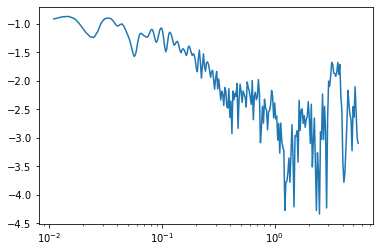

In [4]:
#print(shape(periodograms))
plt.plot(frequencies1,periodograms[0][337:])
plt.xscale('log')

In [5]:
lcvsKep_sampled_1perc,lcvsKep_sampled_10perc,lcvsKep_sampled_50perc,lcvsKep_sampled_100perc,lcvsKep_short_1,lcvsKep_short_3,lcvsKep_short_30,lcvsKep_short_90 = pickle.load(open( "/Users/jmartine/science/github/dtuhack/DtUhackOutliers_old/data/sparse_lcvs_v2.pickle", "rb" ), encoding='latin1')
lcvs = lcvsKep_sampled_10perc
Observables=np.load('../data/HR_Observables.npy')
ID = Observables.T[2]

(337,)


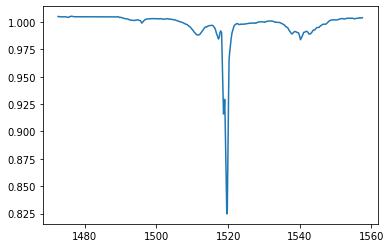

In [6]:
for i in range(2500):
    flux_interp = np.interp(lcvs[44][0],lcvs[i][0],lcvs[i][1])
    lcvs[i][1] = np.array(flux_interp)
    lcvs[i][0] = lcvs[44][0]
print(shape(lcvs[0][0]))
plt.plot(lcvs[0][0],lcvs[0][1])

In [7]:
obj_ids = numpy.arange(len(periodograms))

In [8]:
def return_synthetic_data(X):
    """
    The function returns a matrix with the same dimensions as X but with synthetic data
    based on the marginal distributions of its featues
    """
    features = len(X[0])
    X_syn = numpy.zeros(X.shape)

    for i in range(features):
        obs_vec = X[:,i]
        syn_vec = numpy.random.choice(obs_vec, len(obs_vec)) # here we chose the synthetic data to match the marginal distribution of the real data
        X_syn[:,i] += syn_vec

    return X_syn

X_syn = return_synthetic_data(periodograms)

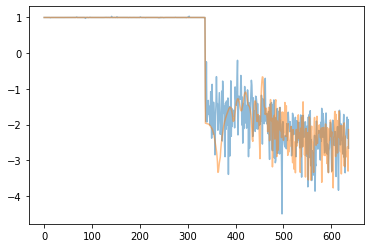

In [9]:
plt.plot(X_syn[2],alpha=0.5)
plt.plot(periodograms[2],alpha=0.5)

0.4388157006529182
1.2440508048586016


(0.95, 1.05)

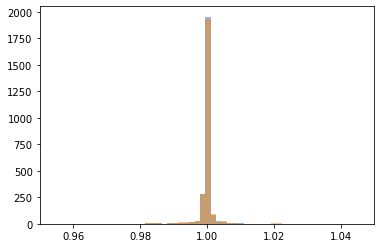

In [10]:
print(np.min(periodograms[:,1]))
print(np.max(periodograms[:,1]))
ito = 60
plt.hist(periodograms[:,ito],bins=200,alpha=0.5)
plt.hist(X_syn[:,ito],bins=200,alpha=0.5)
plt.xlim(0.95,1.05)

400
600


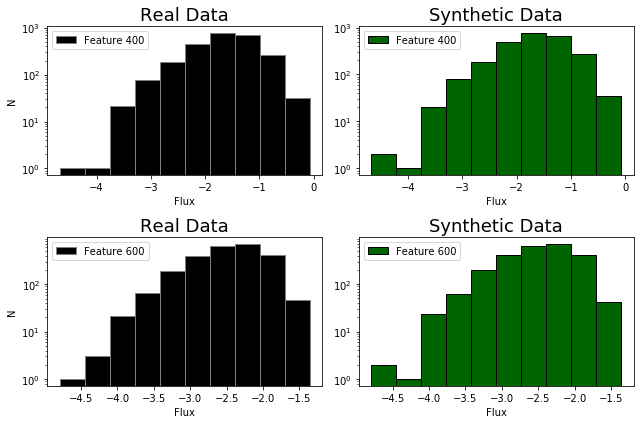

In [11]:
# plots synthetic features against real data checking correct distribution has been achieved.
plt.rcParams['figure.figsize'] = 8, 6
T=[400,600]
j=-1
plt.rcParams['figure.figsize'] = 9,6
for i in T:
    j=j+2
    print(i)
    plt.subplot(2,2,j)
    plt.title('Real Data',fontsize=18)
    plt.hist(periodograms[:, i] ,color="k",edgecolor='grey', label="Feature {}".format(i))
    plt.yscale('log')
    plt.legend(loc='best')
    plt.xlabel('Flux')
    plt.ylabel('N')
    
    plt.subplot(2,2,j+1)
    plt.title('Synthetic Data',fontsize=18)
    plt.hist(X_syn[:, i], color="darkgreen",edgecolor='black', label="Feature {}".format(i))
    plt.yscale('log')
    plt.xlabel('Flux')
    plt.legend(loc='best')
    
plt.tight_layout()

In [12]:
def merge_work_and_synthetic_samples(X, X_syn):
    """
    The function merges the data into one sample, giving the label "1" to the real data and label "2" to the synthetic data
    """
    # build the labels vector
    Y = numpy.ones(len(X))
    Y_syn = numpy.ones(len(X_syn)) * 2

    Y_total = numpy.concatenate((Y, Y_syn))
    X_total = numpy.concatenate((X, X_syn))
    return X_total, Y_total

X_total, Y_total = merge_work_and_synthetic_samples(periodograms, X_syn)
# declare an RF
N_TRAIN = 50 # number of trees in the forest
rand_f = ensemble.RandomForestClassifier(n_estimators=N_TRAIN, 
                                                 max_features='log2', max_depth=100,
                                                min_impurity_decrease=0.000001,min_samples_split=3,
                                                bootstrap=False,warm_start=True)
rand_f.fit(X_total, Y_total)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=100, max_features='log2',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=1e-06, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=3,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=True)

In [13]:
print(shape(X_total))

(5000, 637)


In [11]:
y_pred = rand_f.predict(X_total[4500:])
print(y_pred[0:50])
print(Y_total[4500:][0:50])
print(rand_f.score(X_total[4500:],Y_total[4500:]))

[2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2.]
[2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2.]
1.0


In [14]:
importances = rand_f.feature_importances_
std = np.std([rand_f.feature_importances_ for tree in rand_f.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(periodograms.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))
#rand_f.score(X_total[50000:],Y_total[50000:])

Feature ranking:
1. feature 198 (0.006135)
2. feature 374 (0.004917)
3. feature 239 (0.004815)
4. feature 275 (0.004736)
5. feature 369 (0.004491)
6. feature 72 (0.004346)
7. feature 134 (0.004310)
8. feature 179 (0.004247)
9. feature 109 (0.004047)
10. feature 272 (0.004001)
11. feature 196 (0.003950)
12. feature 248 (0.003917)
13. feature 233 (0.003916)
14. feature 268 (0.003900)
15. feature 365 (0.003890)
16. feature 169 (0.003865)
17. feature 139 (0.003865)
18. feature 73 (0.003864)
19. feature 102 (0.003842)
20. feature 221 (0.003803)
21. feature 300 (0.003780)
22. feature 77 (0.003772)
23. feature 318 (0.003725)
24. feature 271 (0.003707)
25. feature 113 (0.003699)
26. feature 58 (0.003697)
27. feature 79 (0.003645)
28. feature 229 (0.003623)
29. feature 170 (0.003576)
30. feature 25 (0.003549)
31. feature 276 (0.003526)
32. feature 110 (0.003506)
33. feature 40 (0.003495)
34. feature 87 (0.003465)
35. feature 52 (0.003437)
36. feature 148 (0.003431)
37. feature 255 (0.003418)
38

637


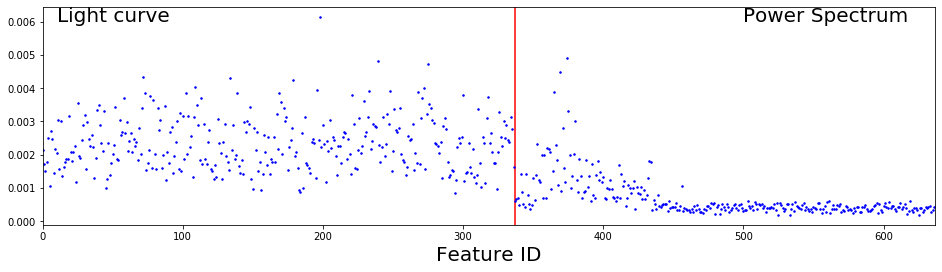

In [15]:
importances = rand_f.feature_importances_
print(len(importances))
feats = arange(len(importances))
plt.rcParams['figure.figsize'] = 16, 4
plt.axvline(x=337, color='r')
plt.plot(feats,importances,'b.', markersize=3)
xlim(0,637)
#ylim(0,0.01)
plt.text(10,0.006,'Light curve',size=20)
plt.text(500,0.006,'Power Spectrum',size=20)
#print(np.sum(importances[:3234]),np.sum(importances[3234:]))
plt.xlabel('Feature ID',size=20)
plt.savefig('/Users/jmartine/Desktop/feat_imp_10perc_sparse.png')

In [16]:
sorted_imp = np.argsort(importances)

In [17]:
# Simlpy records the most/least important features when training the RF forest above.
#imp=[]
#m=np.sort(importances)
#M=m[-10:]
#N=m[279:289]

#imp=zeros(len(M),dtype=int)
#imp_low=zeros(len(M),dtype=int)

#for c, value in enumerate(M, 1):
#    np.sort(importances)
#    for i in range(len(importances)):
#        if importances[i]==value:
#            imp[c-1]=round(i)

#for c, value in enumerate(N, 1):
#    np.sort(importances)
#    for i in range(len(importances)):
#        if importances[i]==value:
#            imp_low[c-1]=round(i)
            


#imp=imp[::-1]
#print(imp)
#print(imp_low)

[313 250 215 311 260 230 211 249 278 204]
[367 152 298 132  75 360 304 317 412 240]


In [17]:
light_curves=2500
def build_similarity_matrix(rand_f, X):
    """
    The function builds the similarity matrix based on the feature matrix X for the results Y
    based on the random forest we've trained
    the matrix is normalised so that the biggest similarity is 1 and the lowest is 0

    This function counts only leaves in which the object is classified as a "real" object 
    it is also implemented to optimize running time, asumming one has enough running memory
    """

    # apply to get the leaf indices
    apply_mat = rand_f.apply(X)
    # find the predictions of the sample
    is_good_matrix = np.zeros(apply_mat.shape)
    for i, est in enumerate(rand_f.estimators_):
        d = est.predict_proba(X)[:, 0] == 1
        is_good_matrix[:, i] = d
    # mark leaves that make the wrong prediction as -1, in order to remove them from the distance measurement
    apply_mat[is_good_matrix == False] = -1
    
    leaf_pop=np.zeros((np.max(apply_mat[:,:]+1),N_TRAIN))
    #creates an array of each leaf population for all trees in RF
    for i in range(light_curves):
        for j in range(N_TRAIN):
            if apply_mat[i,j]!= -1:
                leaf_pop[apply_mat[i,j],j]+=1
                
    #used to normalize and wieght the results heavily towards trees that corretly identify objects as real or synthetic
    Normalization=np.sum(leaf_pop,axis=0)
    Norm_mean=np.mean(Normalization)
    #print('Normalization=',Normalization[20], Norm_mean)
    
    #Reduces each population by 1 to avoid self comparison.
    for i in range(leaf_pop.shape[0]):
        for j in range(N_TRAIN):
            if leaf_pop[i,j]!=0:
                leaf_pop[i,j]-=1
    
    #creates the similarity matrix by using the leaf populations rather then pair matching each light curve
    sim_vec=np.zeros(light_curves)
    for i in range(light_curves):
        for j in range(N_TRAIN):
            sim_vec[i]+=(leaf_pop[(apply_mat[i,j]),j]) #adds normalization here '/Normalization[j]'
    sim_vec/= float(len(sim_vec-1))*N_TRAIN
    return sim_vec
sim_mat = build_similarity_matrix(rand_f, periodograms)
print(sim_mat)
dis_mat=1-sim_mat
print(dis_mat)

[0.010312 0.396856 0.37504  ... 0.389024 0.021768 0.008416]
[0.989688 0.603144 0.62496  ... 0.610976 0.978232 0.991584]


Text(0.5, 0, 'Weirdness Score')

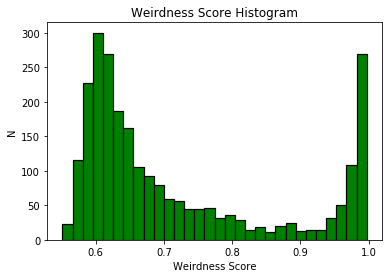

In [18]:
#Plot of Weirdness as a histogram for all objects.
sum_vec=dis_mat
plt.rcParams['figure.figsize'] = 6, 4
plt.title("Weirdness Score Histogram")
tmp = plt.hist(dis_mat, bins=30, color="g", edgecolor='black', linewidth=1.2)
plt.ylabel("N")
plt.xlabel("Weirdness Score")
#plt.tight_layout()
#plt.savefig('/home/dcrake/bin/Histograms/Weirdness_Histogram_Combination.pdf', dpi=600)

In [19]:
print(shape(dis_mat[dis_mat>0.9]))

(494,)


198 374
1
239 275
2
369 72
3
134 179
4


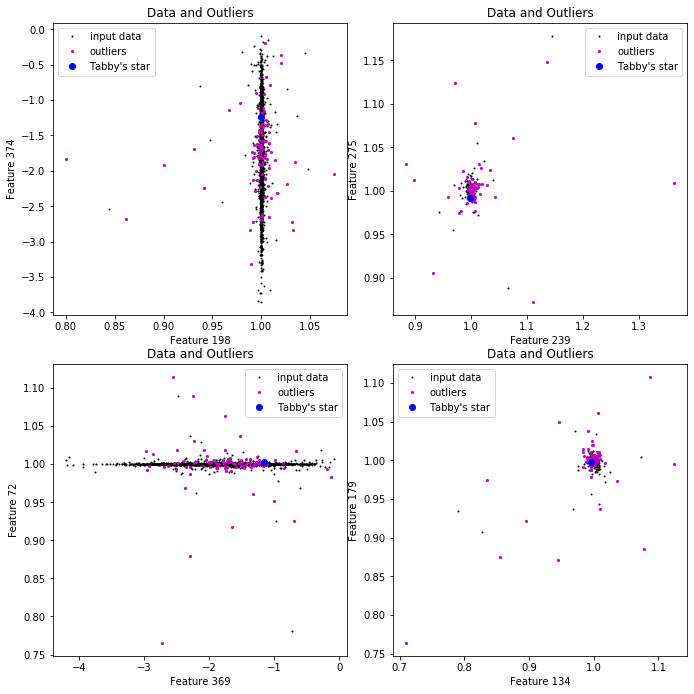

In [20]:
N_outliers = 100
sum_vec_outliers = numpy.sort(sum_vec)[::-1][:N_outliers]
obj_ids_outliers = obj_ids[numpy.argsort(sum_vec)][::-1][:N_outliers]

T=sorted_imp[::-1][0:10]
j=0
q=-2
plt.rcParams['figure.figsize'] = 10,10
for i in range(0,4):
    j+=1
    q+=2
    print(T[q],T[q+1])
    plt.subplot(2,2,j)
    plt.title("Data and Outliers")
    print(j)
    plt.plot(periodograms[:,T[q]], periodograms[:,T[q+1]], "ok", label="input data", markersize=1)
    plt.plot(periodograms[obj_ids_outliers, T[q]], periodograms[obj_ids_outliers, T[q+1]], "om", label="outliers", markersize=2)
    plt.plot(periodograms[0,T[q]], periodograms[0,T[q+1]], "ok", label="Tabby's star", markersize=6, color='b')
    plt.xlabel("Feature {}".format(T[q]))
    plt.ylabel("Feature {}".format(T[q+1]))
    plt.legend(loc="best")
    #plt.xscale('log')
    #plt.yscale('log')
    #if i==1: plt.xlim(0.985,1.015)


plt.tight_layout()    
plt.tight_layout(pad=2.0, w_pad=0.2, h_pad=0.2)
# plt.savefig('drives_weirdness.ps',dpi=300,bbox_inches='tight')
# plt.savefig('drives_weirdness.png',dpi=300,bbox_inches='tight')
#plt.savefig('/home/dcrake/bin/Histograms/drives_weirdness.pdf',dpi=300,bbox_inches='tight')

In [21]:
print(np.sort(periodograms[:,337]))

[-4.32358377 -4.27919298 -4.22443334 ... -0.07772172 -0.04320776
 -0.03884144]


In [22]:
# Creates an array of ordered by Wierdness.
N_outliers = 2500
sum_vec_outliers = numpy.sort(sum_vec)[::-1][:N_outliers]
obj_ids_outliers = obj_ids[numpy.argsort(sum_vec)][::-1][:N_outliers]
print (obj_ids_outliers)

[1660  866   24 ... 1934  369 2444]


In [23]:
N_outliers = 2500
sum_vec_outliers = numpy.sort(sum_vec)[::-1][:N_outliers]
obj_ids_outliers = obj_ids[numpy.argsort(sum_vec)][::-1][:N_outliers]
kep_obj_ids_outliers=[]

for i in range(2500):
    kep_obj_ids_outliers.append(ID[obj_ids_outliers[i]])
    
for c, value in enumerate(obj_ids_outliers):
    if value==0:
        print(c, value)    
        if value==0:
            print("Tabby's Star =",kep_obj_ids_outliers[c])
            if kep_obj_ids_outliers[c] == 'kplr008462852':
                print('TRUE')
            else: print('FALSE')

sum_vec_outliers1 = numpy.sort(sum_vec)[:N_outliers]
obj_ids_outliers1 = obj_ids[numpy.argsort(sum_vec)][:N_outliers]
kep_obj_ids_outliers1=[]
for i in range(2500):
    kep_obj_ids_outliers1.append(ID[obj_ids_outliers1[i]])




213 0
Tabby's Star = 20 6 15.45 
FALSE


857 kplr007189915 0
711 kplr009141383 0
1153 kplr010798218 0
726 kplr007834063 0
566 kplr005200777 0
1373 kplr009479757 0
969 kplr010297313 0
1378 kplr007104742 0
1947 kplr010730166 0


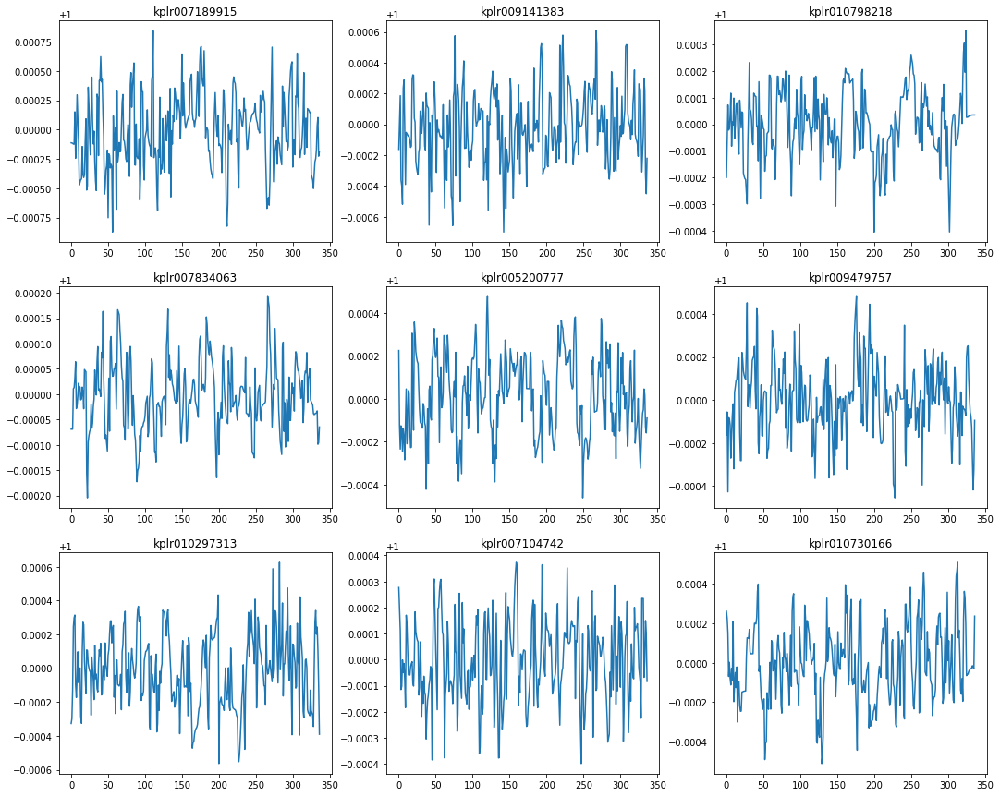

In [24]:
j=0
plt.rcParams['figure.figsize'] = 18,15
s=2400
for i in np.arange(s,s+9):
    print(Observables[obj_ids_outliers[i]][0],Observables[obj_ids_outliers[i]][1],Observables[obj_ids_outliers[i]][-1])
    j+=1
    plt.subplot(3,3,j)
    plt.plot(lcvs[obj_ids_outliers[i]][1][:])
    plt.title("{}".format(Observables[obj_ids_outliers[i]][1]))
    plt.xticks()
    plt.yticks()

# Tabulates the Objects, Categorized by SIMBAD type.

In [25]:
Type=['*','PM*','Ro*','WU*','Er*','Al*','err','RG*','dS*','Pu*','GiC','EB*','Pl?','V*','G','gD*','LP*','WD*','Ce*','**','RR*','SB*','HS*','RB?','Mi*','*iC']
Key=['Star','High Proper-Motion Star','Rotationally Variable Star','Eclipsing binary of W UMa Type','Eruptive variable Star','Eclipsing Binary of Algol Type','Error','Red Giant Branch Star','Variable Star of delta Sct type','Pulsating Variable Star','Galaxy in Cluster of Galaxies','Eclipsing binary','Extra-Solar Planet Candidate','Variable Star','Galaxy','Variable Star of Gamma Dor Type','Long-Period Variable Star','White Dwarf','Cepheid variable Star','Double or Multiple Star','Variable Star of RR Lyr Type','Spectroscopic Binary','Hot Subdwarf','Possible Red Giant Branch Star','Variable Star of Mira Cet Type','Star in Cluster']

Sum=0
Count=np.zeros(len(Type),dtype=int)
for i in range(len(Observables)):
    Sum_prev=Sum
    for j in range(len(Type)):
        if Observables[i][5]==Type[j]: Count[j]+=1
    Sum=np.sum(Count)

Type_Frequency=pd.DataFrame({'Symbol': Type,'Type':Key,'Number': Count})
Type_Frequency.sort_values(by=['Number'], ascending=False)

,Symbol,Type,Number
0,*,Star,1778
2,Ro*,Rotationally Variable Star,479
7,RG*,Red Giant Branch Star,73
1,PM*,High Proper-Motion Star,33
11,EB*,Eclipsing binary,25
4,Er*,Eruptive variable Star,24
5,Al*,Eclipsing Binary of Algol Type,17
14,G,Galaxy,11
8,dS*,Variable Star of delta Sct type,10
3,WU*,Eclipsing binary of W UMa Type,9


# Runs the RF Algorithm over N repeats, using both Periodograms and Fluxes as features

In [26]:
# Run the algorithm N times, 
import time
obs_ids_outliers_all = []
obs_ids_outliers1_all = []
scores_more = []
scores_less = []
start=time.time()
Weirdness=np.zeros((2500,2))

for i in range(20): # N
    print(i,time.time()-start)
    X_syn = return_synthetic_data(periodograms)
    X_total, Y_total = merge_work_and_synthetic_samples(periodograms, X_syn)
    # declare an RF
    N_TRAIN = 50 # number of trees in the forest
    rand_f = ensemble.RandomForestClassifier(n_estimators=N_TRAIN, 
                                                 max_features='log2', max_depth=100,
                                                min_impurity_decrease=0.000001,min_samples_split=3,
                                                bootstrap=False,warm_start=True)
    rand_f.fit(X_total, Y_total)
    # Build sim_matrix
    sim_mat = build_similarity_matrix(rand_f, periodograms)
    dis_mat=1-sim_mat
    sum_vec=dis_mat
    N_outliers=100    
    sum_vec_outliers = np.sort(sum_vec)[::-1][:N_outliers]
    scores_more.append(sum_vec_outliers)
    obs_ids_outliers_all.append(obj_ids[np.argsort(sum_vec)][::-1][:N_outliers])
    sum_vec_outliers1 = np.sort(sum_vec)[:N_outliers]
    scores_less.append(sum_vec_outliers1)
    obs_ids_outliers1_all.append(obj_ids[np.argsort(sum_vec)][:N_outliers])
    for j in range(2500):
        Weirdness[j][0]+=dis_mat[j]
        if i==19:
            Weirdness[j][0]/=20
        Weirdness[j][1]=int(j)
end=time.time()-start
print('Time elapsed =',end,'seconds')
print (np.shape(obs_ids_outliers_all))

0 0.001058816909790039
1 9.432269096374512
2 20.02676510810852
3 29.043290853500366
4 38.26456618309021
5 55.53357195854187
6 67.66886520385742
7 79.08301401138306
8 88.45411896705627
9 98.54794192314148
10 108.8418800830841
11 119.5194320678711
12 132.33047103881836
13 140.44907402992249
14 150.5473039150238
15 159.1596109867096
16 168.68853902816772
17 177.16512489318848
18 186.63963294029236
19 196.9813268184662
Time elapsed = 207.2064709663391 seconds
(20, 100)


In [56]:
# Sorts objects by average weirdness over all repeats.
np.set_printoptions(formatter={'float_kind':'{:f}'.format})
Weirdness=Weirdness[Weirdness[:,0].argsort()]
print(Weirdness[:20])
final_ids=(Weirdness[:,1])
#print(final_ids)

[[0.514283 949.000000]
 [0.514300 576.000000]
 [0.516304 890.000000]
 [0.516587 1278.000000]
 [0.517090 2435.000000]
 [0.517205 914.000000]
 [0.517208 2355.000000]
 [0.517449 516.000000]
 [0.518093 2073.000000]
 [0.518354 2444.000000]
 [0.518425 1408.000000]
 [0.519135 1019.000000]
 [0.519191 1097.000000]
 [0.519432 1453.000000]
 [0.519879 728.000000]
 [0.520224 910.000000]
 [0.520289 1252.000000]
 [0.520378 1985.000000]
 [0.520575 1079.000000]
 [0.521229 369.000000]]


In [38]:
print(final_ids[-200:].astype(int))
#print(Weirdness[-25:])

[1193  971  602 2344  874 2369  723    0  145 1469 1091  452  713  261
 2234  671 2024  822  467 1637 1406 1643  956 1145 1284 1778  232  385
 2341  427  682  143 2127 1902 1156 1148  808   80 1257  196 1279  542
 2499 1514  819  882  668  350 2237 2244 2309  579 1974  265  594 2069
  203  511 1984 1418  177 2088 1053  839 1183 1441 1933 1922 1163 1328
 2020 1192 1580  856  216 2165  519  363 2331 1843 1242 1108  460 1693
 1551 1258 1948  879 1793  974 1883  635 1461 1487 1537 2202 2264 1205
 1217 1274  395 2333 1303  569 2026  404 1873  580  859 1386 2183  394
 1318 2082 2031 2147  290 1421  753  219 2471 1250 1470 1518  498 1851
 1554 2029 1596  256  904 1271 1327 1950  625  366 1352  142 1452  619
 1266   32  611  215  409 1973 1370 2427  678  897 1671  351  867  852
 2032   34  798 2000   24  858 2420 2163 1133  393 1720  466  585 1946
  536 1755 1773 2396 1136  195  900  722  108   55  360 2118 2338 2176
   12 1419 1384 2126 1560 2071 2382 2388 2091 2436  696  326 1781 2402
 1817 

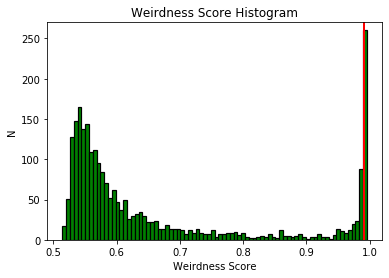

In [46]:
plt.rcParams['figure.figsize'] = 6, 4
plt.title("Weirdness Score Histogram")
tmp = plt.hist(Weirdness[:,0], bins=80, color="g", edgecolor='black', linewidth=1.2)
plt.ylabel("N")
plt.xlabel("Weirdness Score")
plt.plot([0.990870,0.990870],[0,270],linewidth=2,color='r')
plt.ylim(0,270)
plt.savefig('weirdness_with_tabby_10perc_sparse.png')
plt.savefig('weirdness_with_tabby_10perc_sparse.pdf')
plt.savefig('weirdness_with_tabby_10perc_sparse.ps')

In [47]:
print(shape(Weirdness[:,0][Weirdness[:,0]>0.95]))

(433,)


In [135]:
# N_outliers = 2500
# sum_vec_outliers = numpy.sort(Weirdness[:,0])[::-1][:N_outliers]
# obj_ids_outliers = obj_ids[numpy.argsort(Weirdness[:,0])][::-1][:N_outliers]
#frint

0.5483011999999998


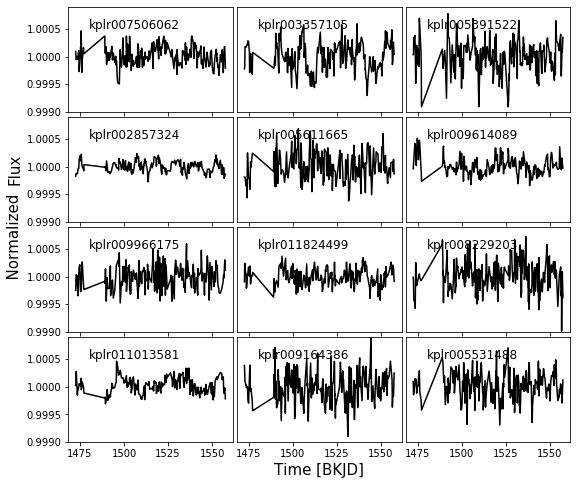

In [160]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

plt.figure(figsize = (9,8))
gs1 = gridspec.GridSpec(4, 3)
gs1.update(wspace=0.025, hspace=0.05) # set the spacing between axes. 

ito = 12*50
for i in range(ito,ito+12):
   # i = i + 1 # grid spec indexes from 0
    j = i%12
    ax1 = plt.subplot(gs1[j])
    plt.axis('on')
    ax1.plot(lcvs[0][0],lcvs[int(final_ids[i])][1][:],color='black')
    ax1.set_ylim(0.999,1.0009)
    ax1.text(1480,1.0005,str(Observables[int(final_ids[i])][1]),size=12)
    ax1.set_xticks([1475,1500,1525,1550])
    #ax1.set_yticks([1-0.0003,1,1+0.0003,1+0.0006])
    #ax1.set_yticklabels(['-3E-4','1.0','3E-4','6E-4'])
    if (((i)%3!=0)):
        #print('AAA',j)
        ax1.get_yaxis().set_visible(False)
    else:
        ax1.get_yaxis().set_visible(True)
    if (((i)<9)):
        #print('AAA',j)
        ax1.get_xaxis().set_visible(False)
    if (j==10):
        plt.xlabel('Time [BKJD]',size=15)
    if (j==3):
        plt.ylabel('Flux',size=15)
    if (j==6):
        plt.ylabel('                  Normalized',size=15)        
print(Weirdness[ito,0])

plt.savefig('lvc1_weirdness_'+str(Weirdness[ito,0])+'.png')
plt.savefig('lvc1_weirdness_'+str(Weirdness[ito,0])+'.ps')
plt.savefig('lvc1_weirdness_'+str(Weirdness[ito,0])+'.pdf')
    #ax1.set_xticklabels([])
    #ax1.set_yticklabels([])
    #ax1.set_aspect('equal')

In [43]:
'''Creates a table highlighting the number of each type of object in the weirdest 100 list. This number of compared to 
the expected number in a list of 100 randomly selected objects from the total population. This table can be used to analyse 
the type of objects each method identifies as 'Weird'.'''
Weirdest_Count_all=np.zeros(len(Type),dtype=int)
Least_Weird_Count_all=np.zeros(len(Type),dtype=int)
Percentage_all=[]
Identity_all=[]
Perc=np.zeros(len(Type))
N_Outliers=100
for i in range(N_Outliers):
    Identity_all.append(Observables[int(final_ids[-i])][4])
    for j in range(len(Type)):
        if Observables[int(final_ids[-i])][5]==Type[j]:
            Weirdest_Count_all[j]+=1

for i in range(len(Type)):    
    Percentage_all.append(round(Weirdest_Count_all[i]*100/Count[i],2))    
for i in range(len(Type)):
    Perc[i]=round(Count[i]*N_Outliers/2500,2)
    
Weird_Frequency=pd.DataFrame({'Symbol': Type,'Type':Key,'Number': Count,'Percentage Identified':Percentage_all,'Identified': Weirdest_Count_all,'Random Selection':Perc})
Weird_Frequency.sort_values(by=['Percentage Identified'], ascending=False)

,Symbol,Type,Number,Percentage Identified,Identified,Random Selection
3,WU*,Eclipsing binary of W UMa Type,9,100.00,9,0.36
20,RR*,Variable Star of RR Lyr Type,2,100.00,2,0.08
9,Pu*,Pulsating Variable Star,3,66.67,2,0.12
17,WD*,White Dwarf,3,66.67,2,0.12
15,gD*,Variable Star of Gamma Dor Type,2,50.00,1,0.08
8,dS*,Variable Star of delta Sct type,10,30.00,3,0.40
5,Al*,Eclipsing Binary of Algol Type,17,29.41,5,0.68
4,Er*,Eruptive variable Star,24,29.17,7,0.96
11,EB*,Eclipsing binary,25,28.00,7,1.00
16,LP*,Long-Period Variable Star,5,20.00,1,0.20


/Users/jmartine/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


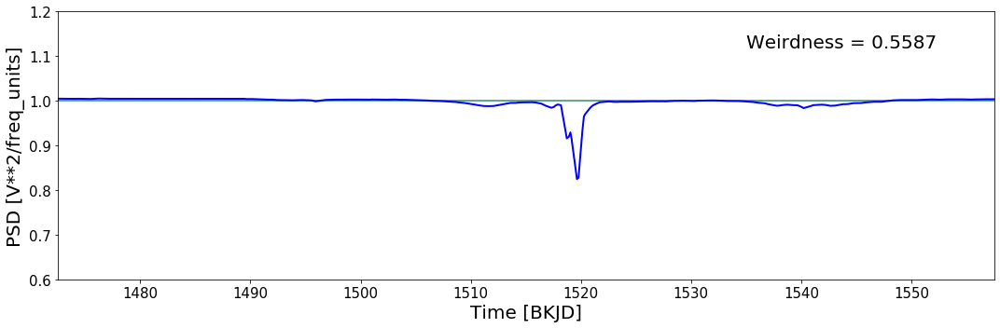

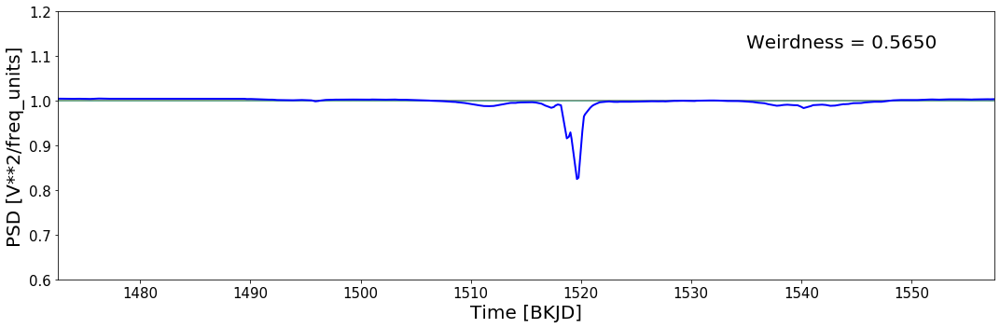

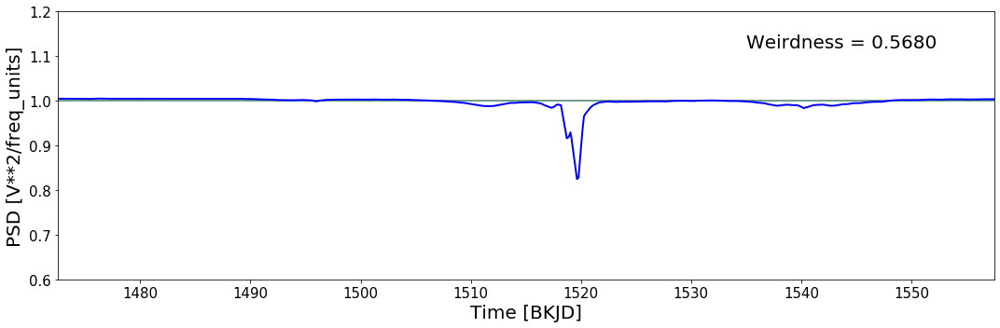

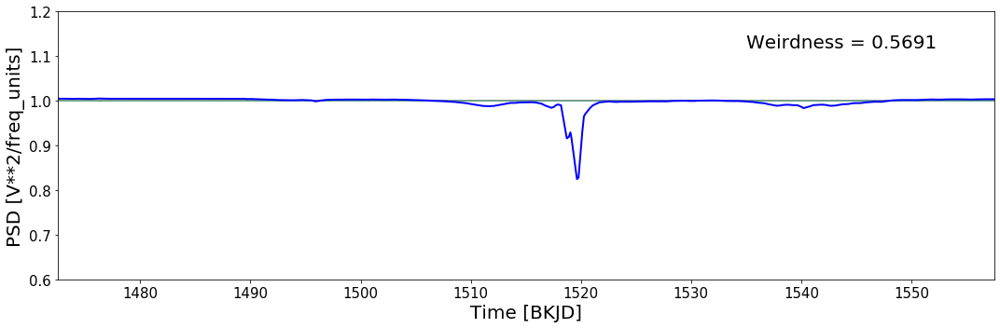

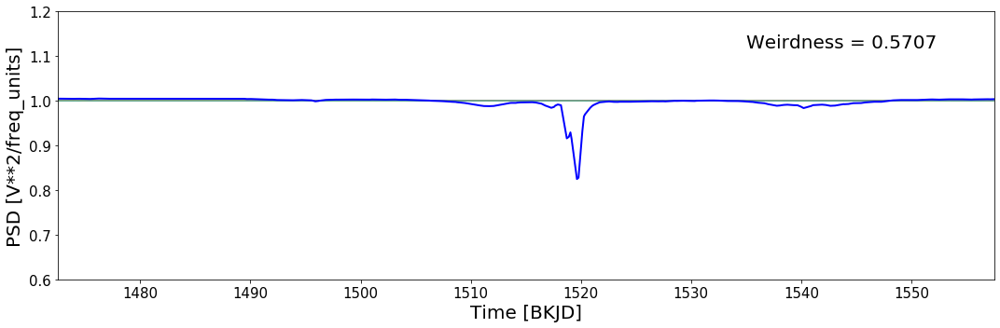

...

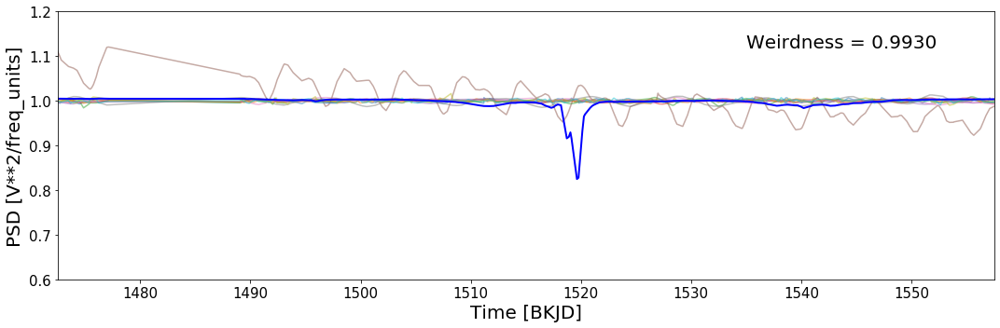

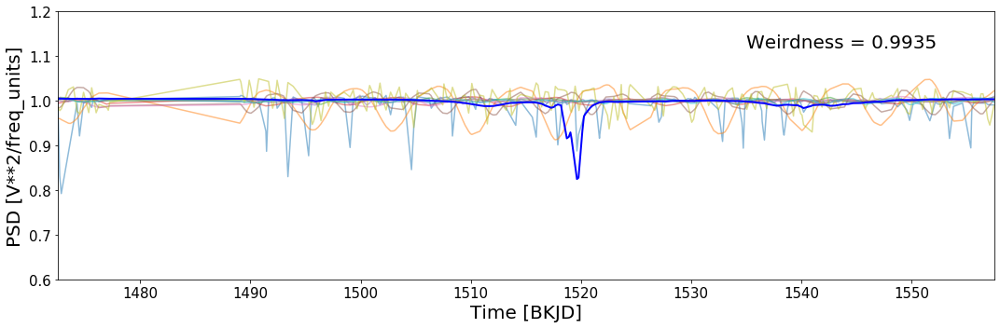

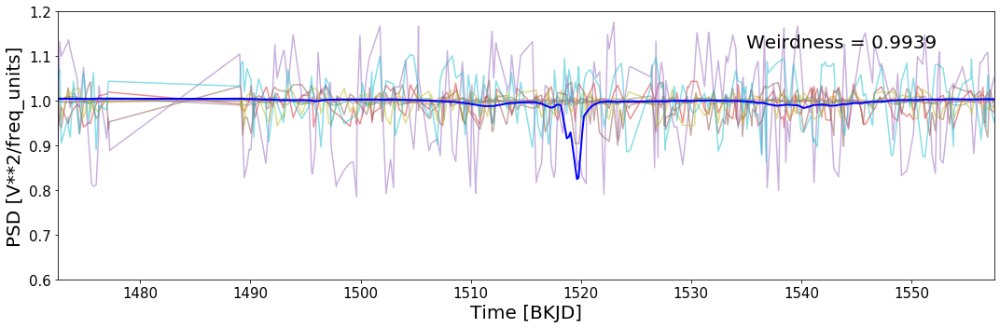

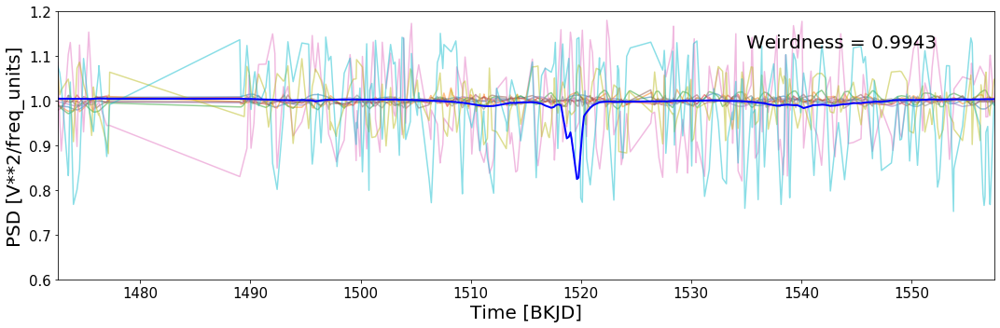

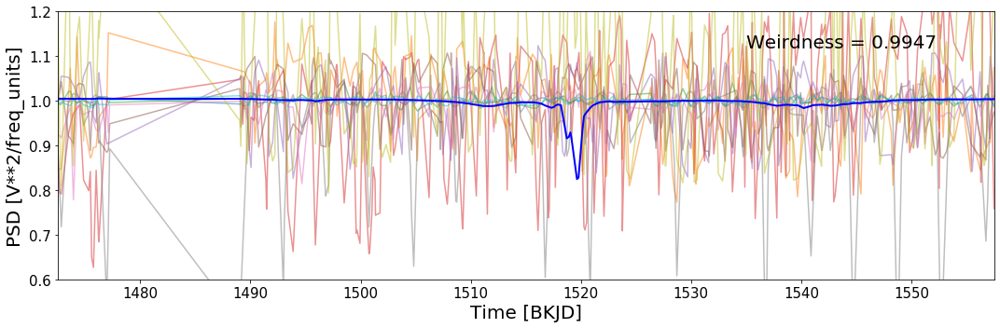

In [91]:
from numpy import random

#indices = random.randint(0,2499,5)

for j in range(0,250):
    plt.figure(figsize=(15,5))
    indices = final_ids[j*10:j*10+10].astype(int)
    for i in indices: 
        plt.plot(lcvs[0][0],periodograms[i][:337],alpha=0.5)
    xlim(lcvs[0][0][0],lcvs[0][0][-1])
    ylim(0.6,1.2)
    plt.plot(lcvs[0][0],periodograms[0][:337],linewidth=2,color='b')
    #plt.xlabel('Arbitrary frequency',size=15)
    plt.xlabel('Time [BKJD]',size=20)
    plt.text(1535,1.12,'Weirdness = '+str("{0:.4f}".format(Weirdness[:][j*10][0])),size=20)
    #plt.text(1125,1.0015,str((4+j*4)/10.)+'% of max weirdness',size=15)
    #plt.xscale('log')
    #plt.yscale('log')
    plt.ylabel('PSD [V**2/freq_units]',size=20)
    plt.tick_params(axis='both', which='major', labelsize=15)
    plt.tick_params(axis='both', which='minor', labelsize=15)
    plt.tight_layout()
    #plt.ylabel('Normalized flux',size=15)
    plt.savefig('/Users/jmartine/Desktop/lc_10perc_sparse'+str(j).zfill(4)+'.png')
    #plt.savefig('/Users/jmartine/Desktop/lc_100_200.pdf')

In [92]:
from PIL import Image
import glob
 
# Create the frames
frames = []
imgs = glob.glob("/Users/jmartine/Desktop/lc_*sparse*.png")
for i in imgs:
    new_frame = Image.open(i)
    frames.append(new_frame)
 
# Save into a GIF file that loops forever
frames[0].save('/Users/jmartine/Desktop/lc_10perc_sparse_gif_v4.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=90, loop=1)